In [ ]:
%cd /content/drive/MyDrive/COMP 550 Project/data/

[Errno 2] No such file or directory: '/content/drive/MyDrive/COMP 550 Project/data/'
/content


In [ ]:
import pandas as pd

main_data = pd.read_csv('./isarcasmeval_train.csv')
main_data.dropna(subset=['tweet'], inplace=True)
main_data.head()

In [ ]:
!pip install emoji contractions

In [ ]:
# replace user tags with @user, consecutive whitespaces to single space,
# surround punctuations with space as in https://aclanthology.org/2022.semeval-1.133.pdf
# also replace emojis with text desc using 'emoji'
# !pip install emoji contractions

import re
import emoji
import contractions

def expand_contractions(text):
    expanded_text = contractions.fix(text)
    return expanded_text

def preprocess_tweet(tweet):
  # Replace tagged users with @user
  tweet = re.sub(r'@[\w]+', '@user', tweet)

  # Replace multiple white spaces with a single space
  tweet = re.sub(r'\s+', ' ', tweet)

  # Remove more than two successive occurrences of any punctuation
  tweet = re.sub(r'(\s*([.,!?;:()<>{}[\]\-+=~_$%^&*]\s*){2,})', r'\1', tweet)

  # Replace emoji with emoji descriptor
  tweet = emoji.demojize(tweet)

  # Put a single white space around punctuations
  tweet = re.sub(r'([.,!?;:()<>{}[\]\-+=~_$%^&*])', r' \1 ', tweet)

  # expand contractions
  tweet = expand_contractions(tweet)

  return tweet

# main_data['process_tweet'] = [preprocess_tweet(x) for x in main_data['tweet']]

In [ ]:
import json

data2 = []
with open('./sarcasmheadlines_train.json') as f:
  for line in f:
    data2.append(json.loads(line))
data2 = pd.DataFrame(data2)
data2['text'] = data2['headline']
data2['sarcasm_label'] = data2['is_sarcastic']
data2.drop(columns=['headline', 'is_sarcastic', 'article_link'], inplace=True)
data2.head()

,text,sarcasm_label
0,thirtysomething scientists unveil doomsday clo...,1
1,dem rep. totally nails why congress is falling...,0
2,eat your veggies: 9 deliciously different recipes,0
3,inclement weather prevents liar from getting t...,1
4,mother comes pretty close to using word 'strea...,1


In [ ]:
data3 = pd.read_csv('./semeval2018_train.txt', sep='\t')
data3['text'] = data3['Tweet text']
data3['sarcasm_label'] = data3['Label']
data3.drop(columns=['Tweet text', 'Label', 'Tweet index'], inplace=True)
data3.head()

,text,sarcasm_label
0,Sweet United Nations video. Just in time for C...,1
1,@mrdahl87 We are rumored to have talked to Erv...,1
2,Hey there! Nice to see you Minnesota/ND Winter...,1
3,3 episodes left I'm dying over here,0
4,I can't breathe! was chosen as the most notabl...,1


In [ ]:
data4 = pd.read_csv('./isarcasm_train.csv')
data4.head()

,text,sarcasm_label
0,sorry but sue from the mediweight advert looks...,0
1,@davesnyder since this is fantasy can it be an...,0
2,"Good times, fun times here in Grand old Britan...",1
3,I send light and love to all impacted by the #...,0
4,Another year closer to death,0


In [ ]:
data = main_data[['tweet', 'sarcastic']]
data.rename(columns={'tweet': 'text', 'sarcastic':'sarcasm_label'}, inplace=True)
data.head()

<ipython-input-8-35bd6030a05a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.rename(columns={'tweet': 'text', 'sarcastic':'sarcasm_label'}, inplace=True)


,text,sarcasm_label
0,The only thing I got from college is a caffein...,1
1,I love it when professors draw a big question ...,1
2,Remember the hundred emails from companies whe...,1
3,Today my pop-pop told me I was not “forced” to...,1
4,@VolphanCarol @littlewhitty @mysticalmanatee I...,1


In [ ]:
data_list = [data, data2, data3, data4]

In [47]:
data.shape, data2.shape, data3.shape, data4.shape

((3467, 2), (28619, 2), (3817, 2), (2814, 2))

In [48]:
data['sarcasm_label'].value_counts(), data2['sarcasm_label'].value_counts(), data3['sarcasm_label'].value_counts(), data4['sarcasm_label'].value_counts()

(0    2600
 1     867
 Name: sarcasm_label, dtype: int64,
 0    14985
 1    13634
 Name: sarcasm_label, dtype: int64,
 0    1916
 1    1901
 Name: sarcasm_label, dtype: int64,
 0    2333
 1     481
 Name: sarcasm_label, dtype: int64)

## Additional features

In [ ]:
!python -m spacy download en_core_web_md
!pip install flair

In [ ]:
# word2vec/glove, polarity, pos tags

#word2vec
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

def vectorize_sentences_word2vec(sentences, model):
    vectors = [sum([model.wv[word] for word in sentence if word in model.wv]) for sentence in sentences]
    return np.array(vectors)

#glove
import spacy

# Load the pre-trained GloVe model
nlp = spacy.load('en_core_web_md')

def vectorize_sentences_glove(sentences):
    vectors = [nlp(sentence).vector for sentence in sentences]
    return np.array(vectors)

In [ ]:
!pip install transformers[torch] accelerate --upgrade

In [ ]:
from transformers import BertTokenizer, BertModel, AutoTokenizer, AutoModel
import torch

# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Check if a GPU is available and set device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model.to(device)

def vectorize_sentences_bert(sentences):
  vectors=[]
  for sentence in sentences:
    tokens = tokenizer(sentence, return_tensors='pt', padding=True, truncation=True, max_length=512)
    tokens = {key: value.to(device) for key, value in tokens.items()}

    with torch.no_grad():
        outputs = model(**tokens)
    embeddings = outputs.last_hidden_state[:, 0, :]

    vectors.append(embeddings.to('cpu').numpy())
  vectors = np.array(vectors).squeeze(1)
  return vectors

def vectorize_sentences_bert_tweet(sentences):
  tokenizer = AutoTokenizer.from_pretrained("vinai/bertweet-large", use_fast=False)
  model = AutoModel.from_pretrained("vinai/bertweet-large")
  model.to(device)
  vectors=[]
  for sentence in sentences:
    tokens = tokenizer(sentence, return_tensors='pt', padding=True, truncation=True, max_length=512)
    tokens = {key: value.to(device) for key, value in tokens.items()}

    with torch.no_grad():
        outputs = model(**tokens)
    embeddings = outputs.last_hidden_state[:, 0, :]
    vectors.append(outputs.last_hidden_state.mean(dim=1).detach().to('cpu').numpy())
  vectors = np.array(vectors).squeeze(1)
  return vectors

Using device: cuda


In [ ]:
from flair.embeddings import WordEmbeddings
from flair.data import Sentence

def vectorize_pos(text):
  # Load Flair embeddings for POS tags
  pos_embedding = WordEmbeddings('pos')

  pos_vectors = []
  for item in text:
    sentence = Sentence(item)
    pos_embedding.embed(sentence)

    pos_tag_embeddings = [token.embedding.numpy() for token in sentence]

  return np.array(pos_vectors)

In [ ]:
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from nltk import tokenize

def get_sentiment(text):
  sentiment_scores = []

  sia = SentimentIntensityAnalyzer()
  for item in text:
    # Sentiment analysis using nltk
    item_score = []
    for sent in tokenize.sent_tokenize(item):
      sentiment_score_nltk = sia.polarity_scores(sent)['compound']
      item_score.append(sentiment_score_nltk)
    sentiment_scores.append(np.mean(item_score))
  return np.array(sentiment_scores)

def get_polarity(text):
  polarity_terms = []
  for item in text:
    # Polarity analysis using textblob
    item_score = []
    for sent in tokenize.sent_tokenize(item):
      blob = TextBlob(sent)
      item_score.append(blob.sentiment.polarity)
    polarity_terms.append(np.mean(item_score))
  return np.array(polarity_terms)

def get_pos_vectors(text):
  return vectorize_pos(data['text'].values)


In [ ]:
def get_data_vectors(data, method="bert"):
  if method=="tfidf":
    tokens_train = data['text'].apply(lambda x: ' '.join([val for val in word_tokenize(x.lower()) if val not in stop_words])).values
    tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df=2, max_features=1000, stop_words='english')
    x_vectors = tfidf_vectorizer.fit_transform(tokens_train)
    x_vectors = np.array(x_vectors)

  elif method=="word2vec":
    tokenized_sentences = [' '.join(word_tokenize(sentence.lower())) for sentence in data['text']]
    word2vec_model = Word2Vec(sentences=tokenized_sentences, vector_size=1000, window=5, min_count=1, workers=4)
    x_vectors = vectorize_sentences_word2vec(tokenized_sentences, word2vec_model)

  elif method=="glove":
    tokenized_sentences = [' '.join(word_tokenize(sentence.lower())) for sentence in data['text']]
    x_vectors = vectorize_sentences_glove(tokenized_sentences)

  elif method=="bert":
    x_vectors = vectorize_sentences_bert(data['text'].values.tolist())

  elif method=="bert-tweet":
    x_vectors = vectorize_sentences_bert_tweet(data['text'].values.tolist())

  return x_vectors

### Train ML models

In [ ]:
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud,STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')

stop_words = set(stopwords.words('english'))

import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB, GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, KFold
from sklearn.svm import SVC, LinearSVC
from sklearn import metrics, utils
import sklearn
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.feature_extraction.text import TfidfVectorizer

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [ ]:
train_data_list = [[data], [data, data2], [data, data2, data3], [data, data2, data3, data4]]

for idx, df_curr in enumerate([train_data_list[-1]]):
  df_curr = pd.concat(df_curr)

  # basic preprocessing
  df_curr['text'] = [preprocess_tweet(x) for x in df_curr['text']]

  df_train, df_val = train_test_split(df_curr, test_size=0.2, random_state=42)

  xtrain = get_data_vectors(df_train, method="bert")
  xval = get_data_vectors(df_val, method="bert")

  print(xtrain.shape, xval.shape)

  # pos_feats_train = get_pos_vectors(df_train)
  sentiment_feats_train = get_sentiment(df_train['text'].values)
  polarity_feats_train = get_polarity(df_train['text'].values)

  sentiment_feats_val = get_sentiment(df_val['text'].values)
  polarity_feats_val = get_polarity(df_val['text'].values)

  print(sentiment_feats_train.shape, polarity_feats_train.shape)

  xtrain = np.concatenate((xtrain, sentiment_feats_train.reshape((-1,1)), polarity_feats_train.reshape((-1,1))), axis=1)
  xval = np.concatenate((xval, sentiment_feats_val.reshape((-1,1)), polarity_feats_val.reshape((-1,1))), axis=1)

  print(xtrain.shape, xval.shape)

  y_train = df_train['sarcasm_label'].values
  y_val = df_val['sarcasm_label'].values

  rf = RandomForestClassifier(n_estimators=700,
                              max_depth=13,
                              class_weight='balanced_subsample', n_jobs=-1)
  grid_rf = GridSearchCV(rf, {'n_estimators':[700],
                              'max_depth':[13]}, n_jobs=-1)

  xgb_classifier = XGBClassifier(tree_method='gpu_hist', device="cuda")
  grid_xgb = GridSearchCV(xgb_classifier, {'n_estimators':[700],
                                          'max_depth':[11]}, n_jobs=-1)

  lr = LogisticRegressionCV(max_iter=1500)

  lr_model = lr.fit(xtrain, y_train)
  rf_model = grid_rf.fit(xtrain, y_train)
  xgb_model = grid_xgb.fit(xtrain, y_train)

  print("xGB best: ", grid_xgb.best_params_)
  print("RF best: ", grid_rf.best_params_)

  y_pred_lr = lr_model.predict(xval)
  y_pred_rf = rf_model.predict(xval)
  y_pred_xgb = xgb_model.predict(xval)

  print(f'\tVal Accuracy RF: {round(np.mean(y_pred_rf==y_val), 3)}')
  print(f'\tVal Accuracy LR: {round(np.mean(y_pred_lr==y_val), 3)}')
  print(f'\tVal Accuracy XGB: {round(np.mean(y_pred_xgb==y_val), 3)}')

  print(f'\tVal F1 score RF: {round(f1_score(y_val, y_pred_rf), 3)}')
  print(f'\tVal F1 score LR: {round(f1_score(y_val, y_pred_lr), 3)}')
  print(f'\tVal F1 score XGB: {round(f1_score(y_val, y_pred_xgb), 3)}')

(30973, 768) (7744, 768)
(30973,) (30973,)
(30973, 770) (7744, 770)


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [19:12:57] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


xGB best:  {'max_depth': 11, 'n_estimators': 700}
RF best:  {'max_depth': 13, 'n_estimators': 700}
	Val Accuracy RF: 0.782
	Val Accuracy LR: 0.811
	Val Accuracy XGB: 0.817
	Val F1 score RF: 0.726
	Val F1 score LR: 0.773
	Val F1 score XGB: 0.778


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [19:13:34] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  warnings.warn(smsg, UserWarning)


In [ ]:
# test dataset
test = pd.read_csv('./isarcasmeval_taskA_test.csv')

test['text'] = [preprocess_tweet(x) for x in test['text']]

xtest = get_data_vectors(test, method="bert-tweet")

sentiment_feats_test = get_sentiment(test['text'].values)
polarity_feats_test = get_polarity(test['text'].values)

xtest = np.concatenate((xtest, sentiment_feats_test.reshape((-1,1)), polarity_feats_test.reshape((-1,1))), axis=1)

test_labels = test['sarcastic'].values.tolist()

y_pred_lr = lr_model.predict(xtest)
y_pred_rf = rf_model.predict(xtest)
y_pred_xgb = xgb_model.predict(xtest)

print(f'\tVal Accuracy RF: {round(np.mean(y_pred_rf==test_labels), 3)}')
print(f'\tVal Accuracy LR: {round(np.mean(y_pred_lr==test_labels), 3)}')
print(f'\tVal Accuracy XGB: {round(np.mean(y_pred_xgb==test_labels), 3)}')

print(f'\tVal F1 score RF: {round(f1_score(test_labels, y_pred_rf), 3)}')
print(f'\tVal F1 score LR: {round(f1_score(test_labels, y_pred_lr), 3)}')
print(f'\tVal F1 score XGB: {round(f1_score(test_labels, y_pred_xgb), 3)}')

	Val Accuracy RF: 0.758
	Val Accuracy LR: 0.706
	Val Accuracy XGB: 0.748
	Val F1 score RF: 0.071
	Val F1 score LR: 0.275
	Val F1 score XGB: 0.263


| dataset | preprocess | val f1 RF | val f1 LR | val f1 XGB | val accuracy RF | val accuracy LR | val accuracy XGB |
| --- | --- | --- | --- | --- | --- | --- | --- |
| set i | - | 0.355 | 0.0 | 0.261 | 0.702 | 0.756 | 0.706 |
| i+ii | - | 0.527 | 0.666 | 0.646 | 0.675 | 0.73 | 0.715 |
| i+ii+iii | - | 0.5 | 0.653 | 0.625 | 0.652 | 0.697 | 0.685 |
| i+ii+iii+iv | - | 0.51 | 0.615 | 0.601 | 0.666 | 0.706 | 0.692 |
| set i | basic | 0.37 | 0.0 | 0.288 | 0.7 | 0.762 | 0.707 |
| i+ii | basic | 0.537 | 0.668 | 0.644 | 0.676 | 0.717 | 0.707 |
| i+ii+iii | basic | 0.524 | 0.653 | 0.634 | 0.662 | 0.702 | 0.692 |
| i+ii+iii+iv | basic | 0.511 | 0.619 | 0.606 | 0.668 | 0.703 | 0.69 |

| dataset | vectorizer | val f1 RF | val f1 LR | val f1 XGB
| --- | --- | --- | --- | --- |
| set i | TF-IDF | 0.37 | 0.0 | 0.288 |
| i+ii | TF-IDF | 0.537 | 0.668 | 0.644 |
| i+ii+iii | TF-IDF | 0.524 | 0.653 | 0.634 |
| i+ii+iii+iv | TF-IDF | 0.511 | 0.619 | 0.606 |
| set i | GLoVe | 0.048 | 0.0 | 0.12 |
| i+ii | GLoVe | 0.728 | 0.781 | 0.783 |
| i+ii+iii | GLoVe | 0.685 | 0.727 | 0.739 |
| i+ii+iii+iv | GLoVe | 0.682 | 0.719 | 0.728 |
| set i | BERT | 0.20 | 0.0 | 0.15 |
| i+ii | BERT | 0.779 | 0.823 | 0.825 |
| i+ii | BERTweet-large | 0.775 | 0.86 | 0.842 |

DL results

| model | eval F1 |
| --- | --- |
| BERT-base | 0.8575 |
| BERT-large| 0.8645 |
| RoBERTa-base| 0.8673 |
| DeBERTa-base | 0.8426 |
| XLNet| 0.8148 |
| BERTweet-base| 0.8227 |
| BERTweet-large | 0.8651 |
| Ensemble | 0.685 |

## Explain ML

In [ ]:
!pip install lime

In [ ]:
import lime
import sklearn
import numpy as np
import sklearn
import sklearn.ensemble
import sklearn.metrics
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

class VectorizeLime():
  def __init__(self):
    pass
  def transform(self, x):
    xvec = vectorize_sentences_bert_tweet(x)
    sentiment_feats_val = get_sentiment(x)
    polarity_feats_val = get_polarity(x)
    xvec = np.concatenate((xvec, sentiment_feats_val.reshape((-1,1)), polarity_feats_val.reshape((-1,1))), axis=1)
    return xvec

class_names=["not_sarcastic", "sarcastic"]
explainer = LimeTextExplainer(class_names=class_names)

vectorize = VectorizeLime()
c = make_pipeline(vectorize, xgb_model)

for idx in np.arange(len(y_val))[-10:]:
  exp = explainer.explain_instance(df_val['text'].values[idx], c.predict_proba)
  print('Document id: %d' % idx)
  prob = c.predict_proba([df_val['text'].values[idx]])[0]
  print('Pred: ', class_names[np.argmax(prob)] ,'Probability: ', prob)
  print('True class: %s' % class_names[y_val[idx]])
  fig = exp.as_pyplot_figure()
  exp.show_in_notebook(text=True)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7734
Pred:  not_sarcastic Probability:  [0.89791346 0.10208657]
True class: sarcastic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7735
Pred:  not_sarcastic Probability:  [0.9464249  0.05357511]
True class: not_sarcastic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7736
Pred:  not_sarcastic Probability:  [0.99293965 0.00706032]
True class: not_sarcastic


Document id: 7737
Pred:  not_sarcastic Probability:  [0.751356 0.248644]
True class: not_sarcastic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7738
Pred:  sarcastic Probability:  [0.00352871 0.9964713 ]
True class: sarcastic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7739
Pred:  sarcastic Probability:  [0.18840772 0.8115923 ]
True class: sarcastic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Document id: 7740
Pred:  sarcastic Probability:  [5.352497e-05 9.999465e-01]
True class: sarcastic


Document id: 7741
Pred:  not_sarcastic Probability:  [0.9773154 0.0226846]
True class: not_sarcastic


Document id: 7742
Pred:  not_sarcastic Probability:  [0.9958157  0.00418433]
True class: not_sarcastic


Document id: 7743
Pred:  sarcastic Probability:  [0.19493365 0.80506635]
True class: sarcastic


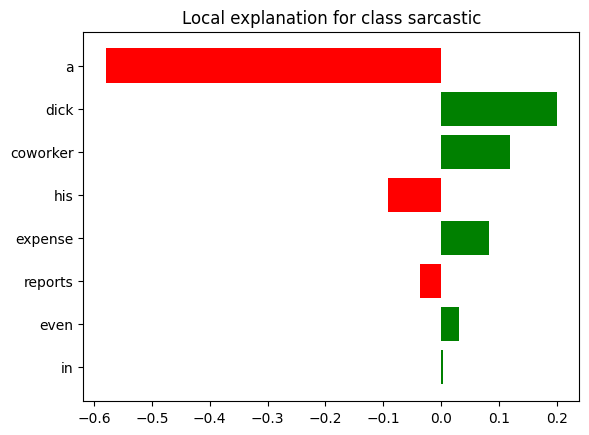

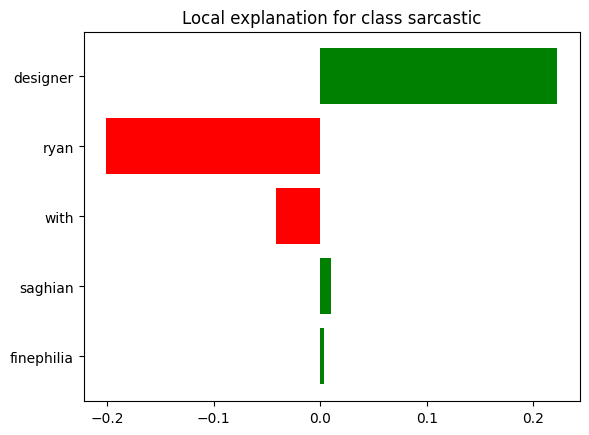

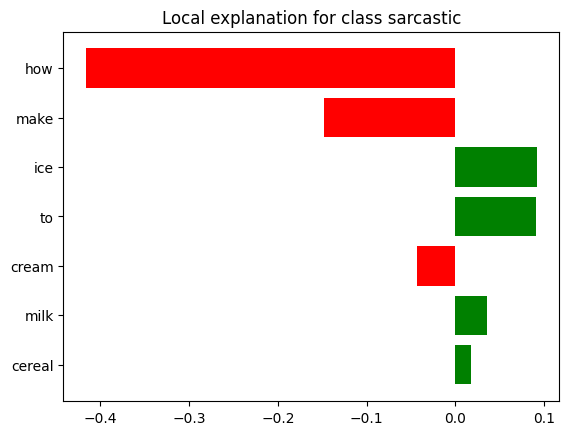

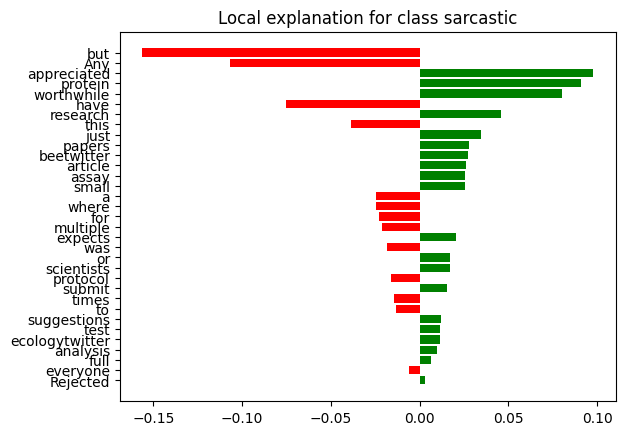

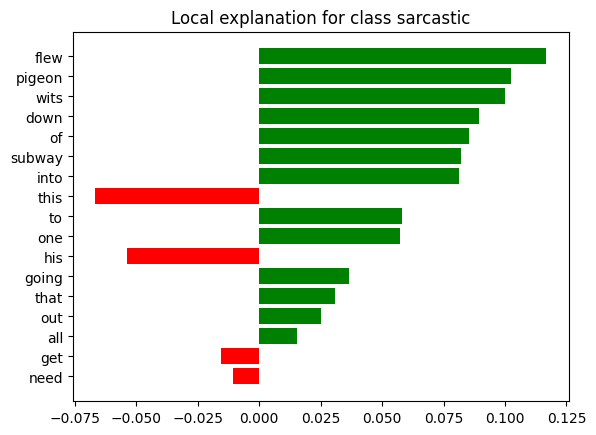

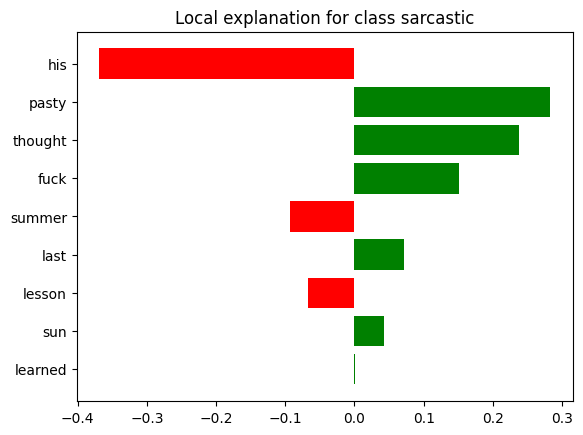

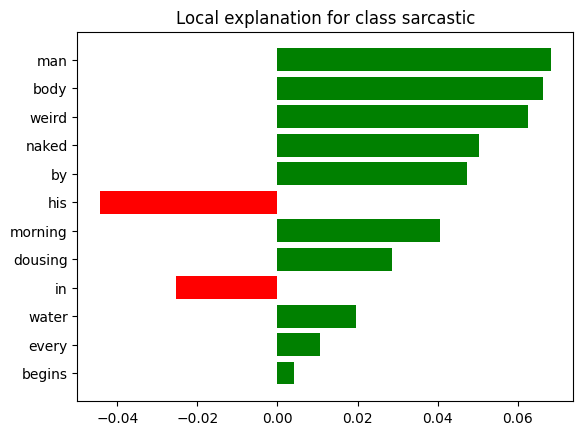

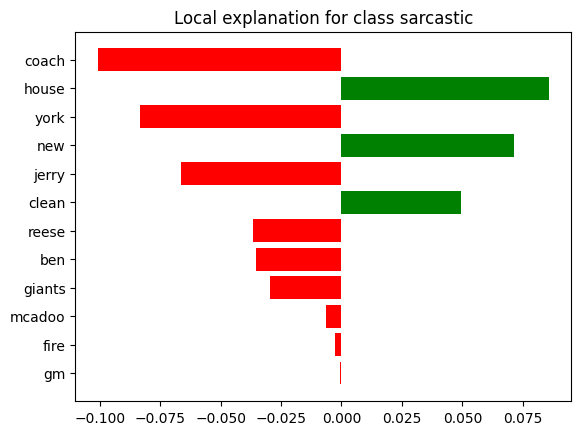

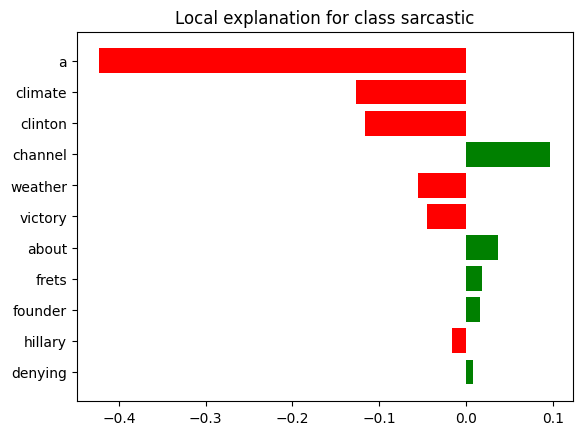

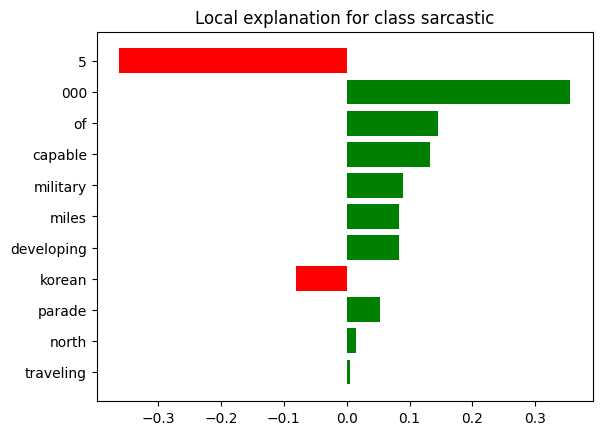

In [ ]:
# glove